In [1]:
%pip install -Uq chromadb datasets

Note: you may need to restart the kernel to use updated packages.


'DOSKEY'��(��) ���� �Ǵ� �ܺ� ����, ������ �� �ִ� ���α׷�, �Ǵ�
��ġ ������ �ƴմϴ�.


In [2]:
%pip uninstall -y thinc spacy
%pip install numpy==1.26.4 datasets --upgrade

Note: you may need to restart the kernel to use updated packages.


'DOSKEY'��(��) ���� �Ǵ� �ܺ� ����, ������ �� �ִ� ���α׷�, �Ǵ�
��ġ ������ �ƴմϴ�.


Note: you may need to restart the kernel to use updated packages.


'DOSKEY'��(��) ���� �Ǵ� �ܺ� ����, ������ �� �ִ� ���α׷�, �Ǵ�
��ġ ������ �ƴմϴ�.


In [3]:
import numpy as np

np.__version__

'1.26.4'

c:\Users\aaab9\miniconda3\envs\langchain_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


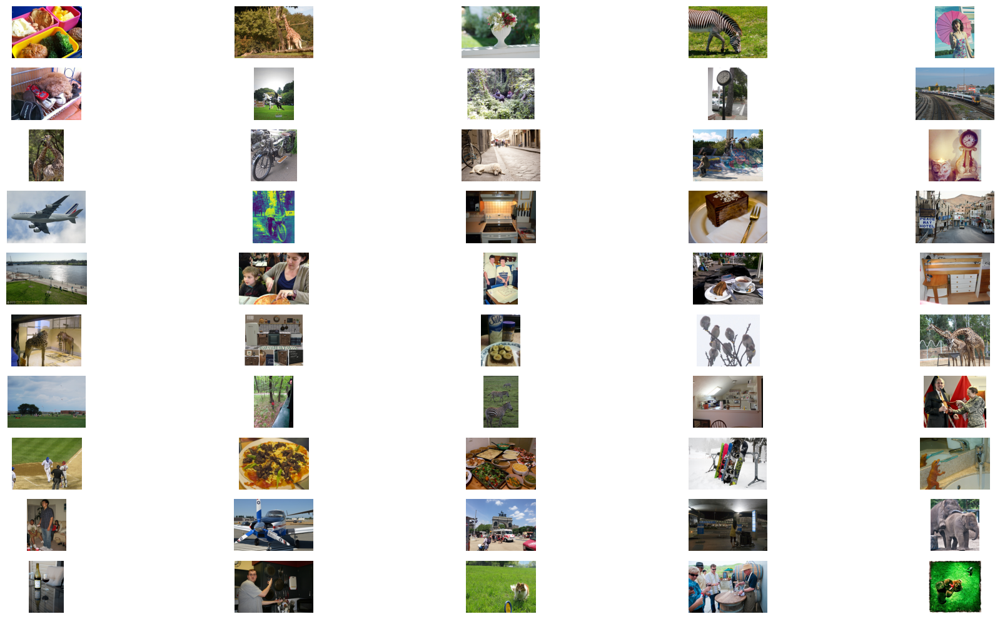

In [4]:
import os
from datasets import load_dataset
from matplotlib import pyplot as plt

dataset = load_dataset(path="detection-datasets/coco", name="default", split="train", streaming=True) #허깅페이스의 detection-datasets/coco를 스트리밍(한 샘플씩 지연 로딩)으로 가져옵니다

IMAGE_FOLDER = "images"
N_IMAGES = 50

# For plotting
plot_cols = 5
plot_rows = N_IMAGES // plot_cols
fig, axes = plt.subplots(plot_rows, plot_cols, figsize=(plot_rows*2, plot_cols*2))
axes = axes.flatten()

# Write the images to a folder
dataset_iter = iter(dataset)
os.makedirs(IMAGE_FOLDER, exist_ok=True)
for i in range(N_IMAGES):
    image = next(dataset_iter)['image']
    axes[i].imshow(image)
    axes[i].axis("off")

    image.save(f"images/{i}.jpg")

plt.tight_layout()
plt.show()

In [5]:
import chromadb
client = chromadb.Client()

In [6]:
from chromadb.utils.embedding_functions import OpenCLIPEmbeddingFunction
from chromadb.utils.data_loaders import ImageLoader

embedding_function = OpenCLIPEmbeddingFunction()
image_loader = ImageLoader()

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
c:\Users\aaab9\miniconda3\envs\langchain_env\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\aaab9\.cache\huggingface\hub\models--laion--CLIP-ViT-B-32-laion2B-s34B-b79K. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate develo

In [10]:
collection = client.create_collection(
    name='multimodal_collection2',
    embedding_function=embedding_function,
    data_loader=image_loader)

In [7]:
os.listdir(IMAGE_FOLDER)

['0.jpg',
 '1.jpg',
 '10.jpg',
 '11.jpg',
 '12.jpg',
 '13.jpg',
 '14.jpg',
 '15.jpg',
 '16.jpg',
 '17.jpg',
 '18.jpg',
 '19.jpg',
 '2.jpg',
 '20.jpg',
 '21.jpg',
 '22.jpg',
 '23.jpg',
 '24.jpg',
 '25.jpg',
 '26.jpg',
 '27.jpg',
 '28.jpg',
 '29.jpg',
 '3.jpg',
 '30.jpg',
 '31.jpg',
 '32.jpg',
 '33.jpg',
 '34.jpg',
 '35.jpg',
 '36.jpg',
 '37.jpg',
 '38.jpg',
 '39.jpg',
 '4.jpg',
 '40.jpg',
 '41.jpg',
 '42.jpg',
 '43.jpg',
 '44.jpg',
 '45.jpg',
 '46.jpg',
 '47.jpg',
 '48.jpg',
 '49.jpg',
 '5.jpg',
 '6.jpg',
 '7.jpg',
 '8.jpg',
 '9.jpg']

In [8]:
os.path.join(IMAGE_FOLDER, '37.jpg')

'images\\37.jpg'

In [11]:
# Get the uris to the images
image_uris = sorted([os.path.join(IMAGE_FOLDER, image_name) for image_name in os.listdir(IMAGE_FOLDER)])
ids = [str(i) for i in range(len(image_uris))]

collection.add(ids=ids, uris=image_uris)

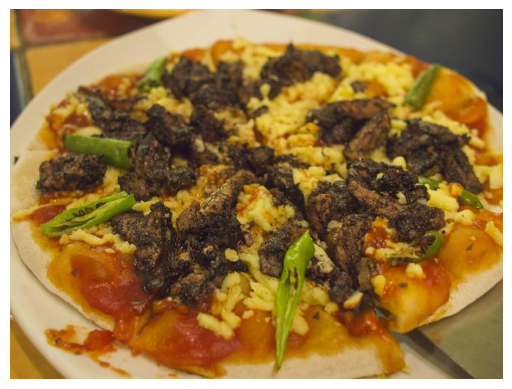

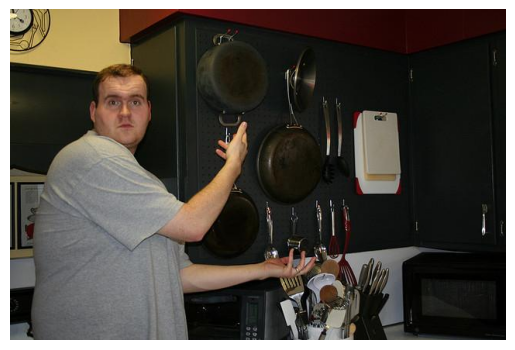

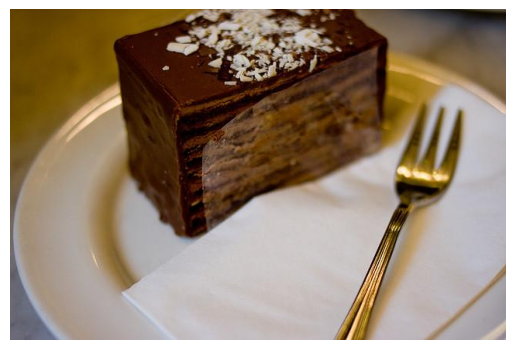

In [12]:
# Querying for "Animals"

retrieved = collection.query(query_texts=["rice"], include=['data'], n_results=3)
for img in retrieved['data'][0]:
    plt.imshow(img)
    plt.axis("off")
    plt.show()

In [ ]:
# retrieved['data'][0][2]

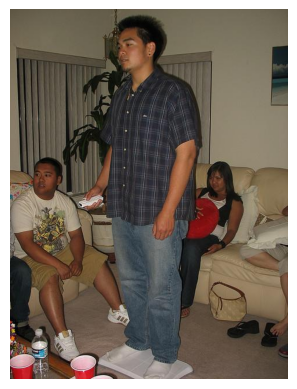

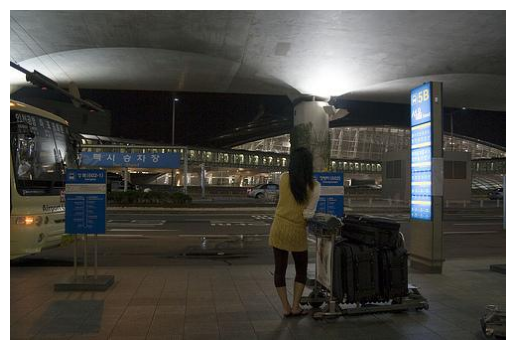

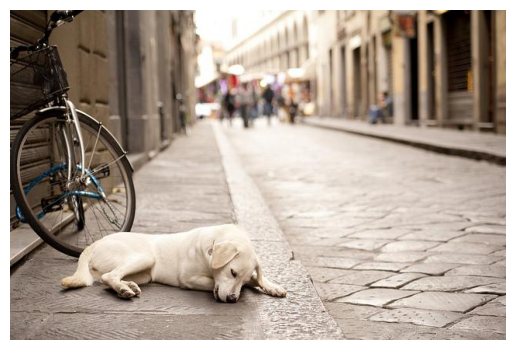

In [13]:
# Querying for "Vehicles"

retrieved = collection.query(query_texts=["people, individuals, figures, humans"], include=['data'], n_results=3)
for img in retrieved['data'][0]:
    plt.imshow(img)
    plt.axis("off")
    plt.show()

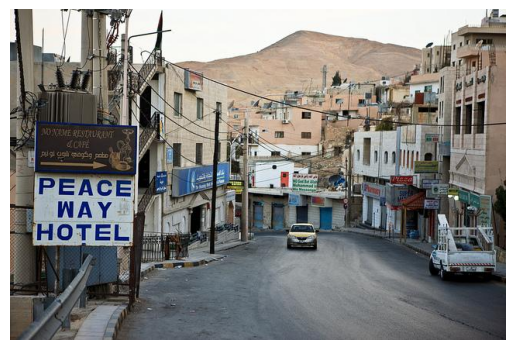

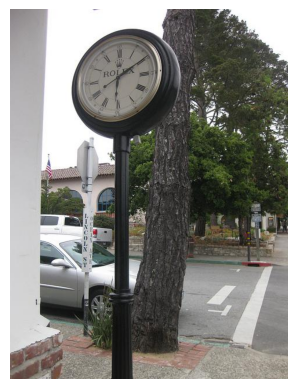

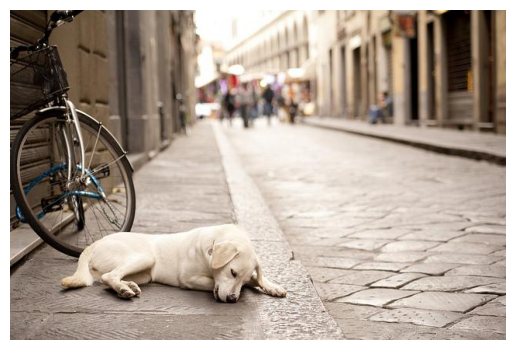

In [14]:
# Querying for "Street Scenes"

retrieved = collection.query(query_texts=["street scene"], include=['data'], n_results=3)
for img in retrieved['data'][0]:
    plt.imshow(img)
    plt.axis("off")
    plt.show()

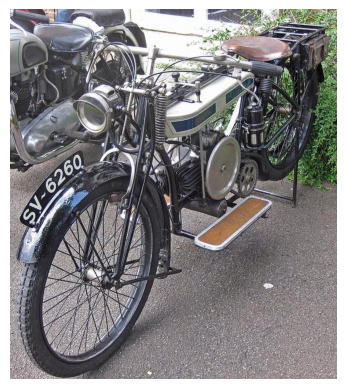

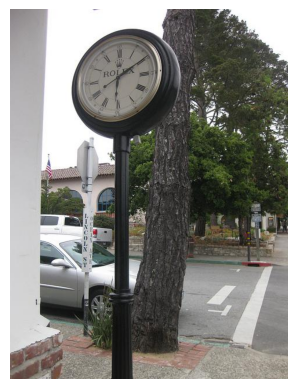

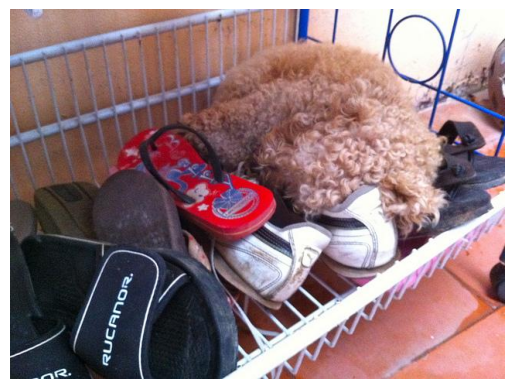

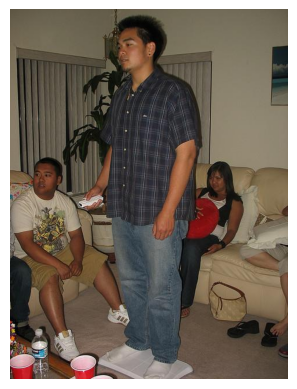

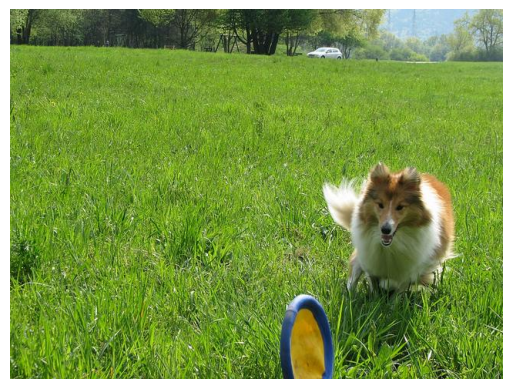

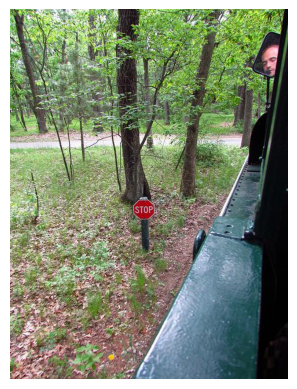

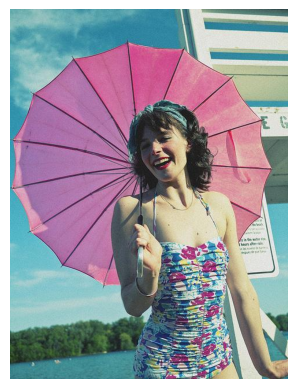

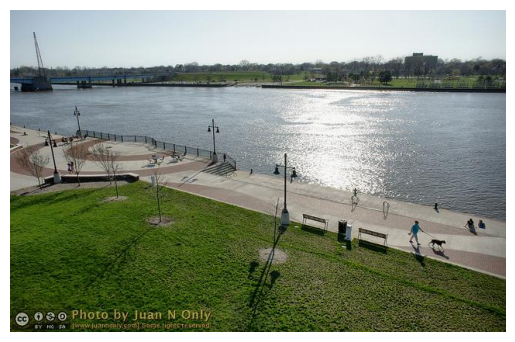

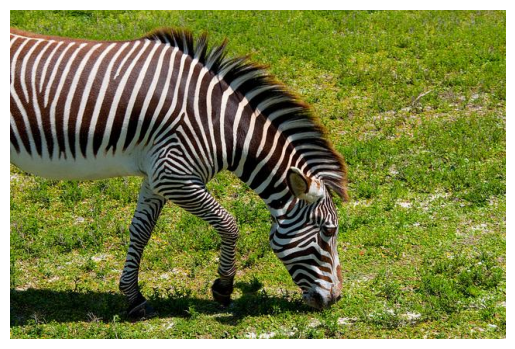

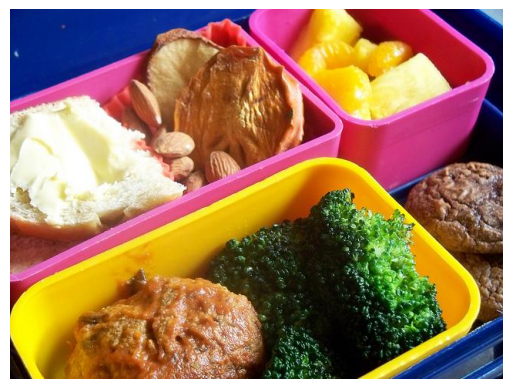

In [15]:
retrieved = collection.query(query_texts=["car"], include=['data'], n_results=10)
for img in retrieved['data'][0]:
    plt.imshow(img)
    plt.axis("off")
    plt.show()

Query Image


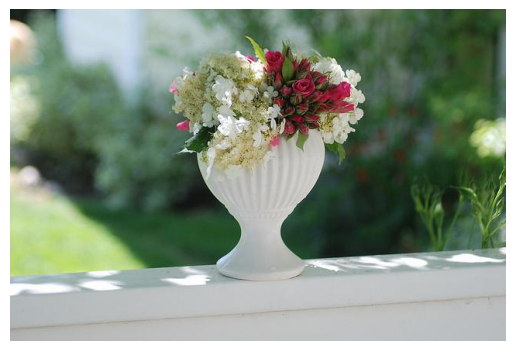

Results


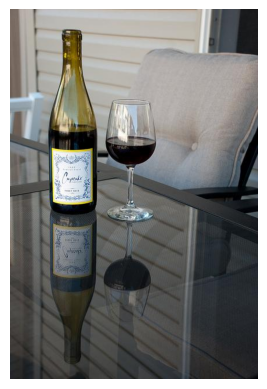

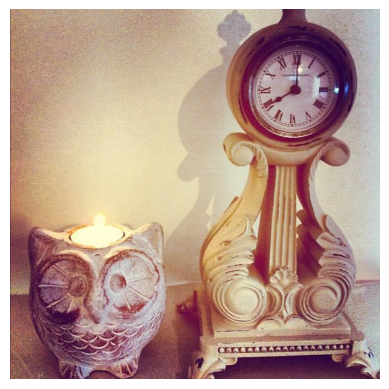

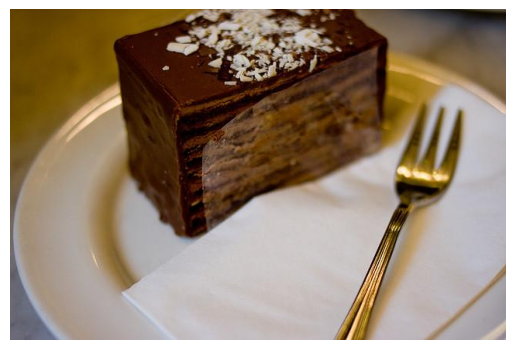

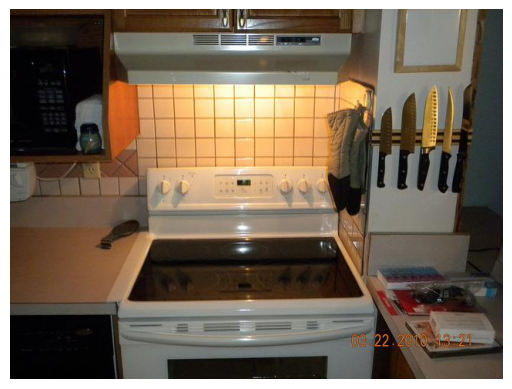

In [16]:
from PIL import Image
import numpy as np

query_image = np.array(Image.open(f"{IMAGE_FOLDER}/2.jpg"))
print("Query Image")
plt.imshow(query_image)
plt.axis('off')
plt.show()

print("Results")
retrieved = collection.query(query_images=[query_image], include=['data'], n_results=5)
for img in retrieved['data'][0][1:]:
    plt.imshow(img)
    plt.axis("off")
    plt.show()

In [17]:
query_image

array([[[ 32,  32,  34],
        [ 31,  31,  33],
        [ 30,  32,  31],
        ...,
        [ 66,  92,  53],
        [ 66,  92,  53],
        [ 66,  92,  53]],

       [[ 31,  31,  33],
        [ 30,  32,  31],
        [ 30,  32,  31],
        ...,
        [ 66,  92,  53],
        [ 67,  93,  54],
        [ 67,  93,  54]],

       [[ 28,  30,  29],
        [ 27,  32,  28],
        [ 27,  32,  28],
        ...,
        [ 67,  93,  54],
        [ 68,  94,  57],
        [ 68,  94,  57]],

       ...,

       [[177, 179, 178],
        [177, 179, 178],
        [177, 179, 178],
        ...,
        [183, 187, 190],
        [183, 187, 190],
        [183, 187, 190]],

       [[177, 179, 178],
        [177, 179, 178],
        [177, 179, 178],
        ...,
        [183, 187, 190],
        [183, 187, 190],
        [183, 187, 190]],

       [[177, 179, 178],
        [177, 179, 178],
        [177, 179, 178],
        ...,
        [183, 187, 190],
        [183, 187, 190],
        [183, 187, 190]]

In [18]:
image_uris[1]

'images\\1.jpg'

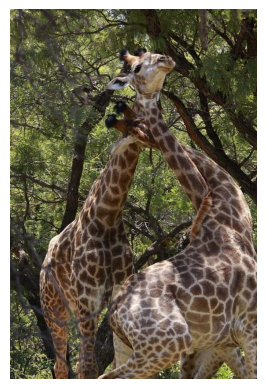

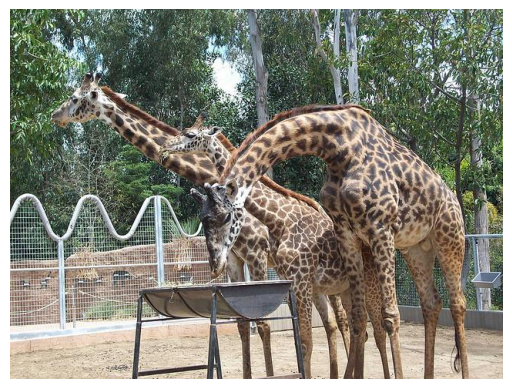

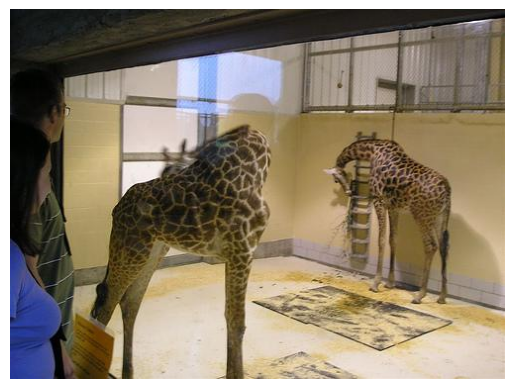

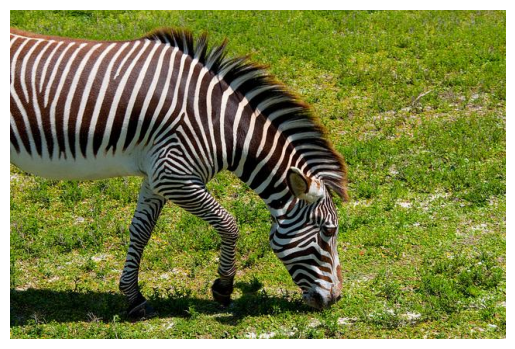

In [19]:
query_uri = image_uris[1]

query_result = collection.query(query_uris=query_uri, include=['data'], n_results=5)
for img in query_result['data'][0][1:]:
    plt.imshow(img)
    plt.axis("off")
    plt.show()